In [1]:
!pip list

Package                       Version
----------------------------- ----------------------
absl-py                       1.3.0
aeppl                         0.0.33
aesara                        2.7.9
aiohttp                       3.8.3
aiosignal                     1.3.1
alabaster                     0.7.12
albumentations                1.2.1
altair                        4.2.0
appdirs                       1.4.4
arviz                         0.12.1
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
async-timeout                 4.0.2
asynctest                     0.13.0
atari-py                      0.2.9
atomicwrites                  1.4.1
attrs                         22.1.0
audioread                     3.0.0
autograd                      1.5
Babel                         2.11.0
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        5.0.1
blis                          0.7.9
bokeh

# 1: Install package

In [2]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output

print(f"Versi torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15073, done.
remote: Counting objects: 100% (112/112), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 15073 (delta 71), reused 85 (delta 55), pack-reused 14961
Receiving objects: 100% (15073/15073), 13.71 MiB | 31.40 MiB/s, done.
Resolving deltas: 100% (10416/10416), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 42.3 MB/s 
     |████████████████████████████████| 41 kB 623 kB/s 
     |████████████████████████████████| 138 kB 42.9 MB/s 
     |████████████████████████████████| 178 kB 15.1 MB/s 
     |████████████████████████████████| 67 kB 3.6 MB/s 
     |████████████████████████████████| 145 kB 54.7 MB/s 
     |████████████████████████████████| 54 kB 649 kB/s 
     |████████████████████████████████| 62 kB 1.1 MB/s 
Versi torch 1.12.1+cu113 (Tesla T4)


# 2: Image Akuisisi



In [3]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [4]:
# buat folder
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [5]:
#ambil dataset dari roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="5s6pm49rP45QR1YXLlYL")
project = rf.workspace("daniel-morantha-yt377").project("ayamdeteksi")
dataset = project.version(2).download("yolov5")


# rf = Roboflow(api_key="5s6pm49rP45QR1YXLlYL")
# project = rf.workspace("daniel-morantha-yt377").project("ayamdeteksi")
# dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/AyamDeteksi-2 in yolov5pytorch:: 100%|██████████| 492/492 [00:00<00:00, 1721.33it/s]


# 3: Latih model YOLOv5

Ket dari argument:
- **img:** define input image size mendefinisikan resolusi gambar input
- **batch:** batch sizenya
- **epochs:** mendefinisikan berapa banyak train yang dilakukan
- **data:** Lokasi dataset sya disini->`dataset.location`
- **weights:** tentukan jalur ke bobot untuk memulai transfer pembelajaran. Di sini kami memilih pos pemeriksaan pretrained COCO umum.
- **cache:** cache gmbr untuk train

In [6]:
!python train.py --img 512 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --name yolov5s_results

train: weights=yolov5s.pt, cfg=, data=/content/datasets/AyamDeteksi-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (offline), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.

# Evaluasi Model YOLOV5 menggunakan tensorboard


[here](https://blog.roboflow.com/mean-average-precision/).

In [7]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Deteksi objek


In [8]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/datasets/AyamDeteksi-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/10 /content/datasets/AyamDeteksi-2/test/images/20221104_081444_jpg.rf.6ce7a28d5c9cadc76eac0c426b0c76a7.jpg: 416x416 1 AyamSegar, 8.2ms
image 2/10 /content/datasets/AyamDeteksi-2/test/images/20221104_081504_jpg.rf.263481fbed7ebedd4058805eb07e3606.jpg: 416x416 1 AyamSegar, 8.2ms
image 3/10 /content/datas

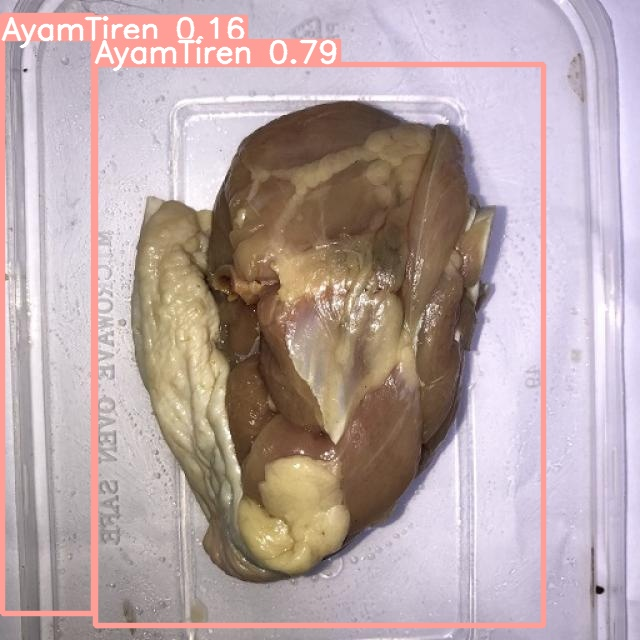

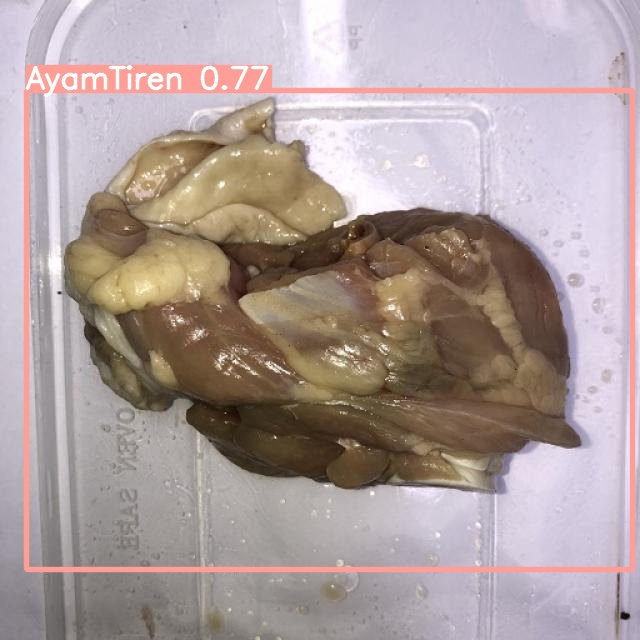

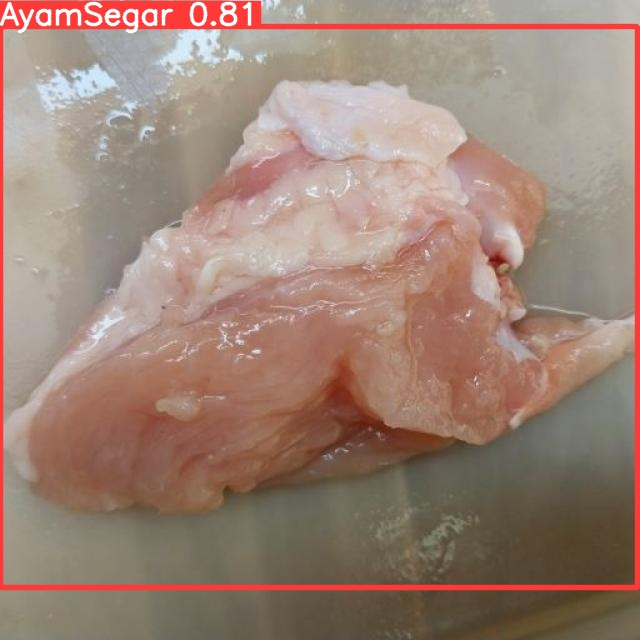

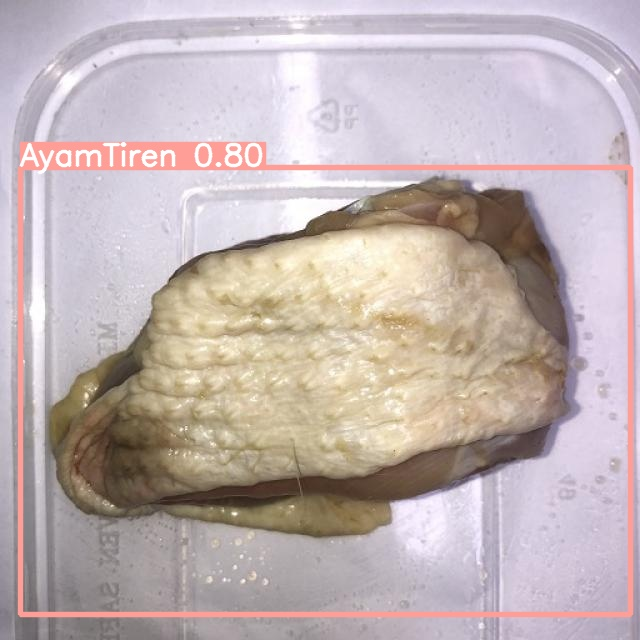

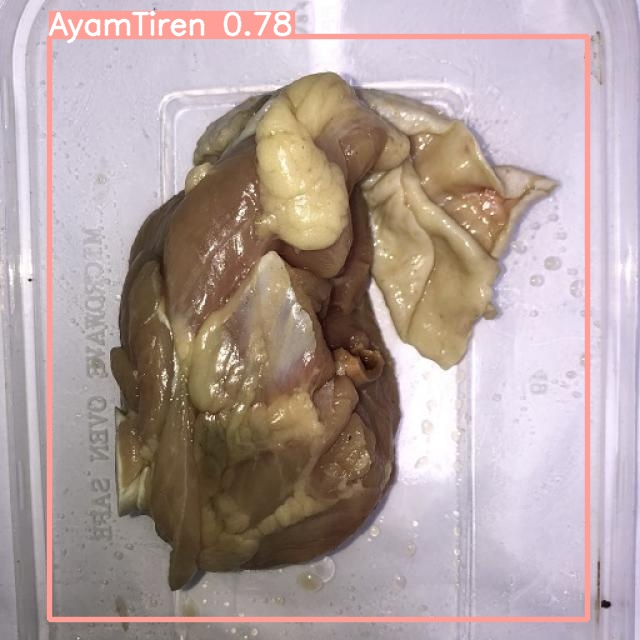

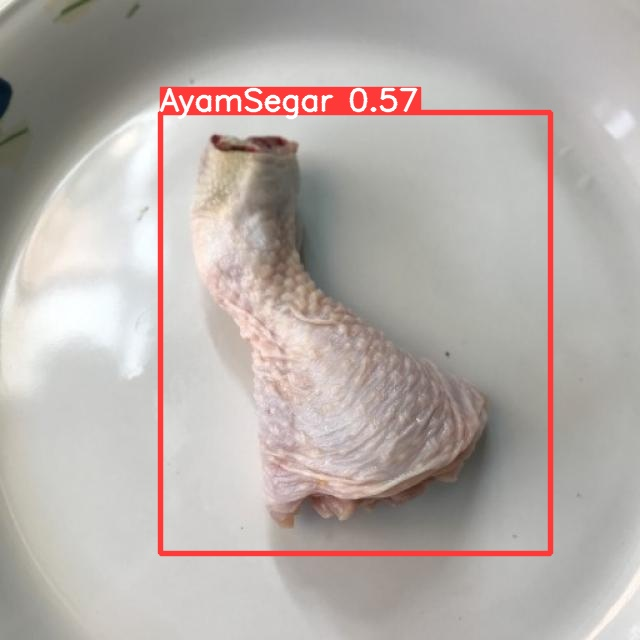

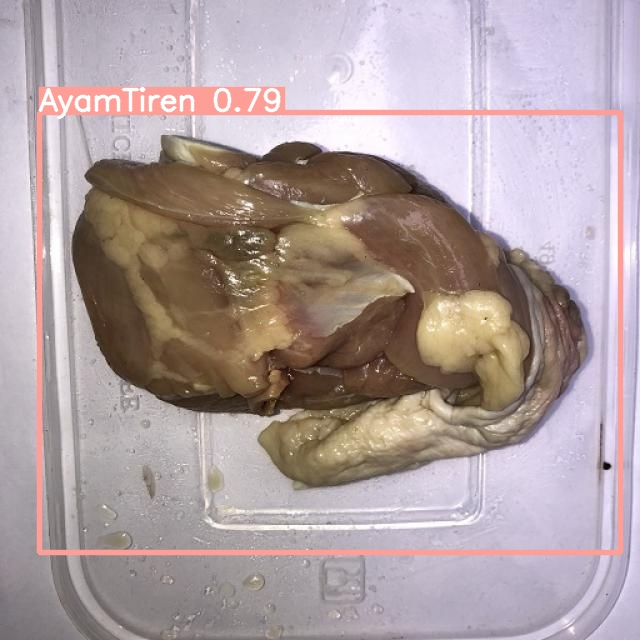

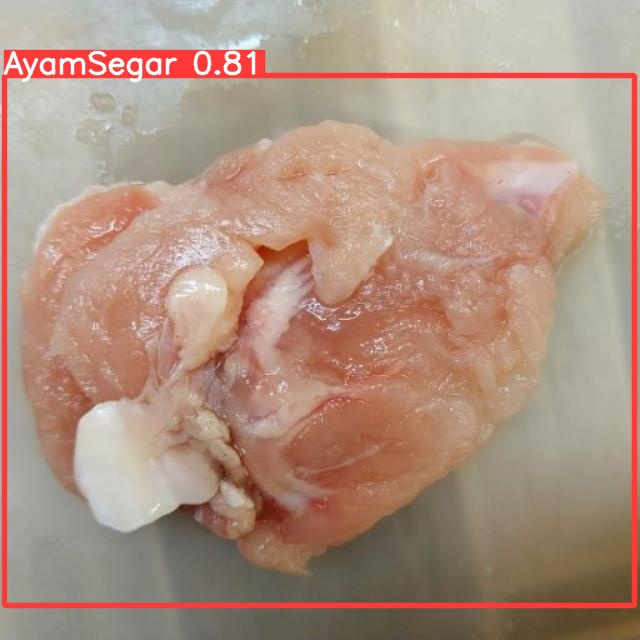

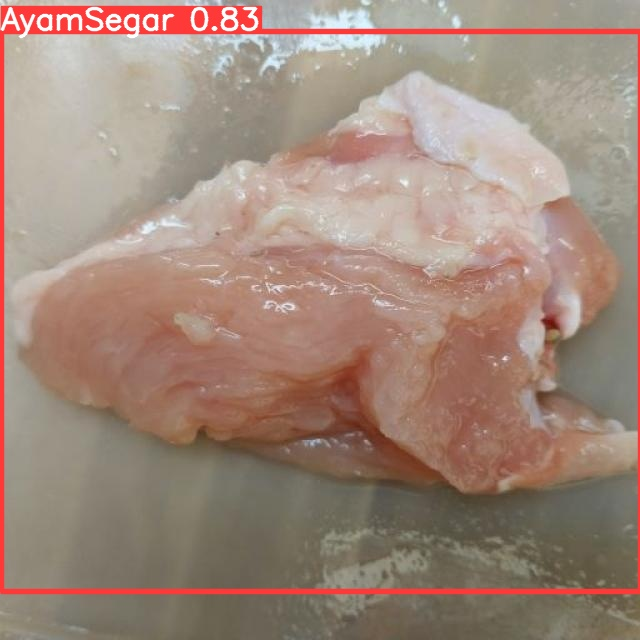

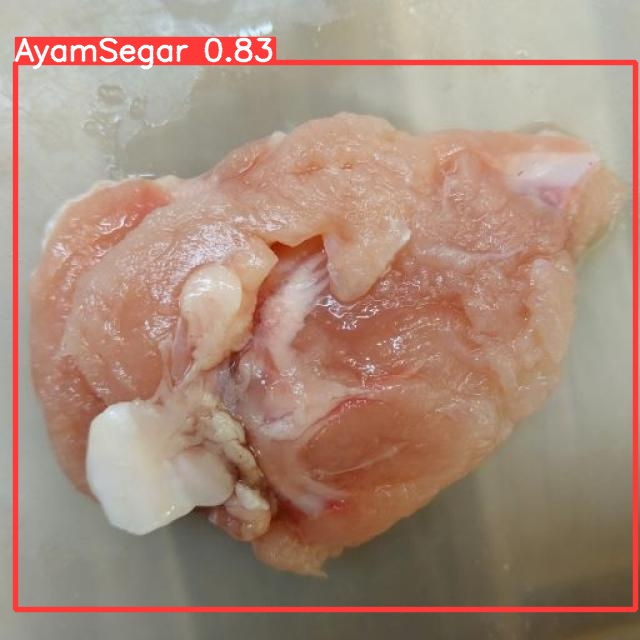

In [9]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [10]:
!ls runs/train/yolov5s_results

confusion_matrix.png				   R_curve.png
events.out.tfevents.1668692431.2b9dba7626ce.184.0  results.csv
F1_curve.png					   results.png
hyp.yaml					   train_batch0.jpg
labels_correlogram.jpg				   train_batch1.jpg
labels.jpg					   train_batch2.jpg
opt.yaml					   val_batch0_labels.jpg
P_curve.png					   val_batch0_pred.jpg
PR_curve.png					   weights


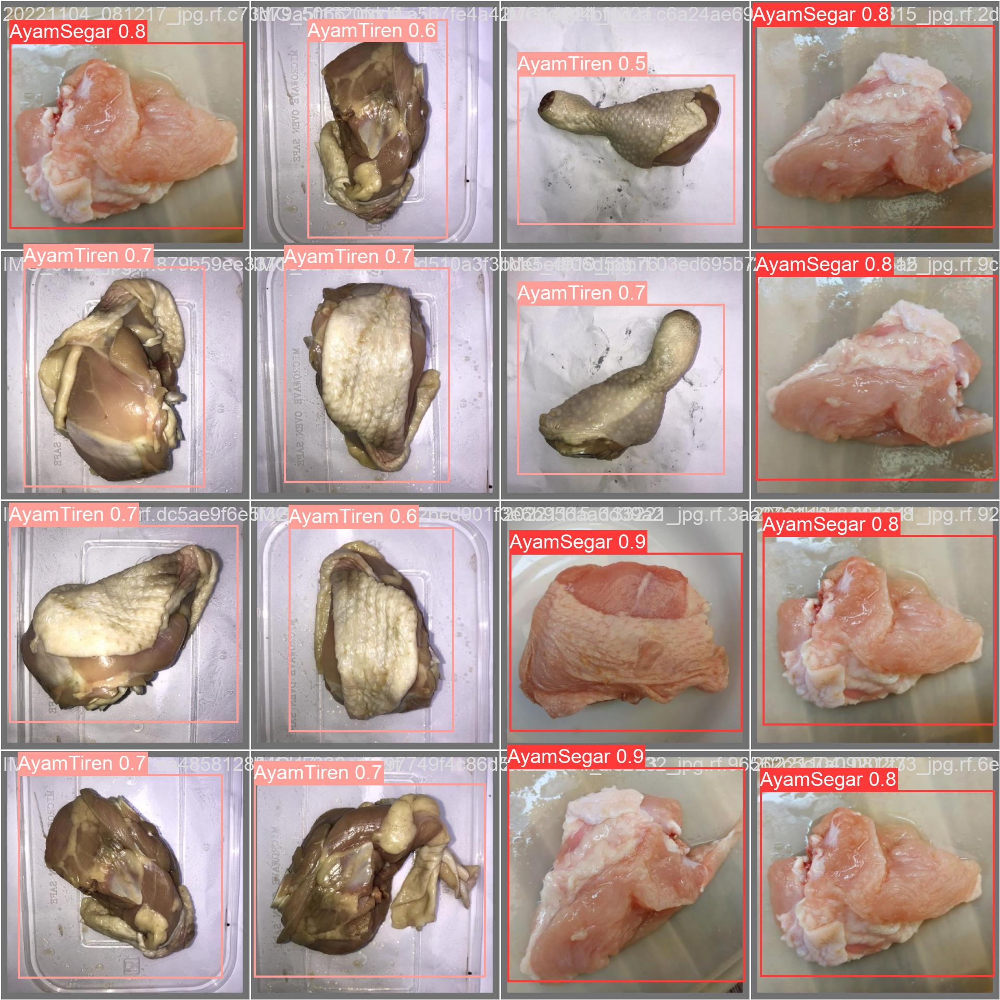

In [11]:
Image(filename='runs/train/yolov5s_results/val_batch0_pred.jpg', width=500)

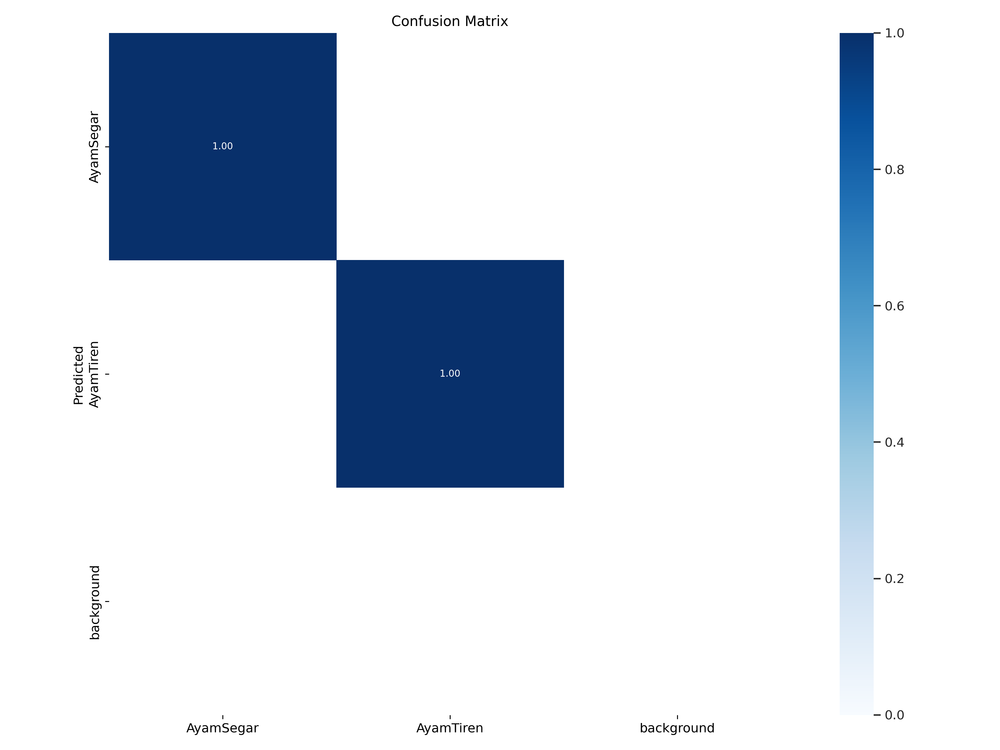

In [12]:
Image(filename='runs/train/yolov5s_results/confusion_matrix.png', width=500)

In [13]:
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data /content/datasets/AyamDeteksi-2/data.yaml --img 416 --iou 0.45 --half

val: data=/content/datasets/AyamDeteksi-2/data.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.45, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/datasets/AyamDeteksi-2/valid/labels.cache' images and labels... 20 found, 0 missing, 0 empty, 0 corrupt: 100% 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:00<00:00,  1.37it/s]
                   all         20         20      0.988          1      0.995      0.671
             AyamSegar         20         11      0.985  

In [14]:
!ls runs/train/yolov5s_results

confusion_matrix.png				   R_curve.png
events.out.tfevents.1668692431.2b9dba7626ce.184.0  results.csv
F1_curve.png					   results.png
hyp.yaml					   train_batch0.jpg
labels_correlogram.jpg				   train_batch1.jpg
labels.jpg					   train_batch2.jpg
opt.yaml					   val_batch0_labels.jpg
P_curve.png					   val_batch0_pred.jpg
PR_curve.png					   weights


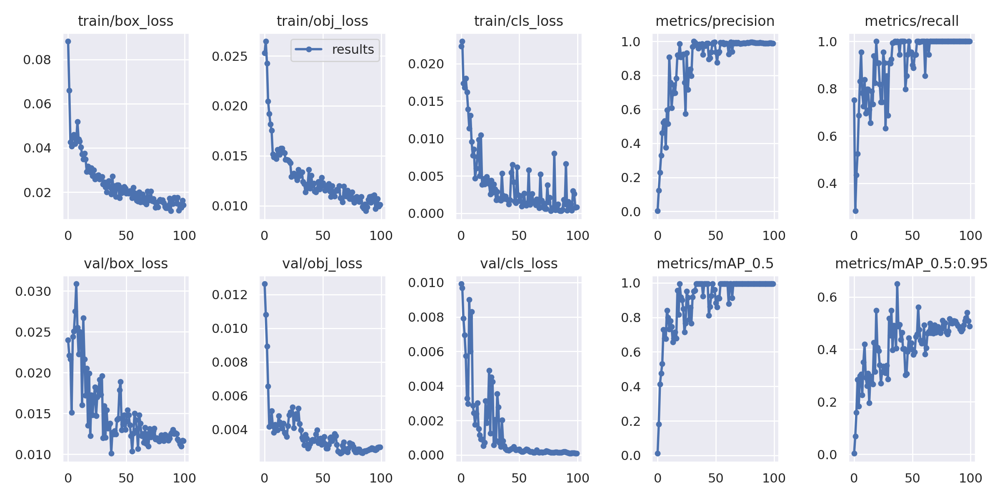

In [15]:
from utils.plots import plot_results  
Image(filename='runs/train/yolov5s_results/results.png', width=1000)
# Image(filename='runs/train/yolov5s_results/P_curve.png', width=1000)  # view results.png


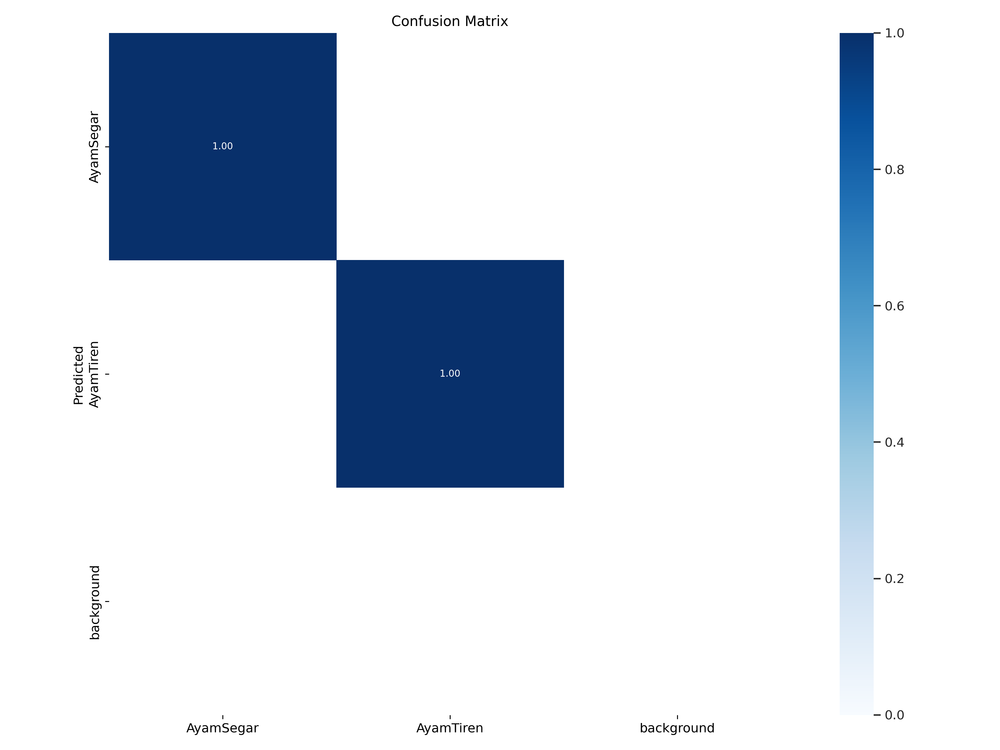

In [16]:
Image(filename='runs/train/yolov5s_results/confusion_matrix.png', width=500)

# Prediksi dengan Recognition objek

In [17]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/IMG_5116.jpg

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/IMG_5116.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/IMG_5116.jpg: 416x416 1 AyamTiren, 8.2ms
Speed: 0.4ms pre-process, 8.2ms inference, 1.2ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp2


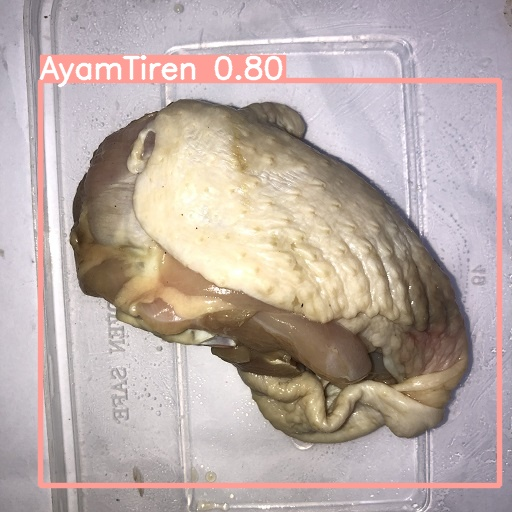

In [18]:
for imageName in glob.glob('runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Save Model

In [19]:
#export your model's weights for future use
from google.colab import files
files.download('runs/train/yolov5s_results/weights/best.pt')
# files.download('runs/train/yolov5s_results')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [3]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path='./best.pt', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\ASUS/.cache\torch\hub\master.zip
YOLOv5  2022-11-18 Python-3.8.8 torch-1.12.0+cu116 CUDA:0 (NVIDIA GeForce MX230, 2048MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [5]:
import torch
from matplotlib import pyplot as plt
import numpy as np
import cv2

cap = cv2.VideoCapture(0)
while cap.isOpened():
    ret, frame = cap.read()
    
    # Make detections 
    results = model(frame)
    
    cv2.imshow('YOLO', np.squeeze(results.render()))
    
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()